In [2]:
import pytesseract as pt
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from pdf2image import convert_from_path

In [3]:
def area(approx):
    x = approx[:,0,0]
    y = approx[:,0,1]
    return (max(x)-min(x))*(max(y)-min(y))

def start_point(approx):
    x = approx[:,0,0]
    y = approx[:,0,1]
    return (min(x),max(y))

def end_point(approx):
    x = approx[:,0,0]
    y = approx[:,0,1]
    return (max(x),min(y))

def get_points(approx):
    x = approx[:,0,0]
    y = approx[:,0,1]
    return (min(x),max(x),min(y),max(y))

def get_all_points(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    coordinates = []
    for contour in contours:
        epsilon = 0.05 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)
        if len(approx) == 4:
            if (area(approx)>5000):
                coordinates.append(get_points(approx))
#                 print(area(approx))
#                 cv2.rectangle(image, start_point(approx),end_point(approx), (0, 255, 255), 5)
    return coordinates

def get_tables(image):
    coordinates = get_all_points(image)
#     print(len(coordinates))
    tables = []
    for coordinate in coordinates:
        tables.append(image[coordinate[2]:coordinate[3],coordinate[0]:coordinate[1]])
    return tables

def get_image_with_table(img):
    image = img
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    coordinates = []
    for contour in contours:
        epsilon = 0.05 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)
        if len(approx) == 4:
            if (area(approx)>5000):
                coordinates.append(get_points(approx))
#                 print(area(approx))
                cv2.rectangle(image, start_point(approx),end_point(approx), (0, 255, 255), 5)
    return image

In [58]:
def get_cells_coordinates(image,v_erode,v_dilate,h_erode,h_dilate):
    img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh1,img = cv2.threshold(img,128,255,cv2.THRESH_OTSU)
    img = cv2.bitwise_not(img)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, img.shape[1]//150))
    hor_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (np.array(img).shape[1]//150, 1))

    vertical_lines = cv2.erode(img, vertical_kernel, iterations=v_erode)
    vertical_lines = cv2.dilate(vertical_lines, vertical_kernel, iterations=v_dilate)

    horizontal_lines = cv2.erode(img, hor_kernel, iterations=h_erode)
    horizontal_lines = cv2.dilate(horizontal_lines, hor_kernel, iterations=h_dilate)

    vertical_horizontal_lines = cv2.addWeighted(vertical_lines, 0.5, horizontal_lines, 0.5, 0.0)
    vertical_horizontal_lines = cv2.erode(~vertical_horizontal_lines, kernel, iterations=3)

    thresh, vertical_horizontal_lines = cv2.threshold(vertical_horizontal_lines,128,255,cv2.THRESH_OTSU)
    b_image = cv2.bitwise_not(cv2.bitwise_xor(img,vertical_horizontal_lines))
    
#     plt.imshow(vertical_horizontal_lines)
#     plt.show()

    contours, hierarchy = cv2.findContours(vertical_horizontal_lines, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    temp_bound_box = [cv2.boundingRect(c) for c in contours]
    (contours, temp_bound_box) = zip(*sorted(zip(contours, temp_bound_box),key=lambda x:x[1][1]))
    boundingBoxes=[]
    for box in temp_bound_box:
#         print(box)
        boundingBoxes.append(box)
    return vertical_horizontal_lines

def get_text_csv(bounding_boxes,image):
#     print(bounding_boxes)
    cols = len(np.unique(np.array(bounding_boxes)[:,0]))
    rows = len(np.unique(np.array(bounding_boxes)[:,1]))
    
    rows_start_points = sorted(np.unique(np.array(bounding_boxes)[:,1]))
    cols_start_points = sorted(np.unique(np.array(bounding_boxes)[:,0]))
    rows_end_points = sorted(np.unique(np.array(bounding_boxes)[:,1]+np.array(bounding_boxes)[:,3]))
    cols_end_points = sorted(np.unique(np.array(bounding_boxes)[:,0]+np.array(bounding_boxes)[:,2]))
    
    table = []
    for i in range(rows):
        table.append([])
        for j in range(cols):
            table[i].append(())

    for idx,box in enumerate(bounding_boxes):
        col_start, row_start, w, h = box
        row_end, col_end = row_start+h,col_start+w
        #     print(rows_start_points.index(row_start)-rows_end_points.index(row_end))
        for i in range(rows_start_points.index(row_start),rows_end_points.index(row_end)+1):
            for j in range(cols_start_points.index(col_start),cols_end_points.index(col_end)+1):
                table[i][j]=box
#                 print(i,j,idx)
#     display_cell(image,table[7][0])
    # text = []
    all_text = ''
    for idx,row in enumerate(table):
    #     text.append([])
        for cell in row:
#             print(cell)
            x, y, w, h = cell
            cell_image=image[y:y+h,x:x+w]
            kernel = np.ones((3,3),np.uint8)
            # cell_image = cv2.erode(cell_image, kernel, iterations = 1)
            # cell_image = cv2.cvtColor(cell_image, cv2.COLOR_BGR2GRAY) 
            # cell_image = cv2.resize(cell_image,(np.shape(cell_image)[1]*2,np.shape(cell_image)[0]*2),cv2.INTER_LINEAR)
            # cell_image = cv2.threshold(cell_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # print(pt.image_to_string(cell_image,config='--psm 6',lang='pan'),np.shape(cell_image))
            ocr_text = pt.image_to_string(cell_image,config='--psm 6',
                                          lang='pan').replace('\n','').replace('\x0c','').replace('_','')
#             print(ocr_text)
            all_text = all_text+ocr_text+','
        #         text[idx].append(ocr_text)
        all_text=all_text+'\n'
    return all_text

In [5]:
def get_cells_coordinates_include_verification(image,v_erode,v_dilate,h_erode,h_dilate):
    img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh1,img = cv2.threshold(img,128,255,cv2.THRESH_OTSU)
    img = cv2.bitwise_not(img)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, img.shape[1]//150))
    hor_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (np.array(img).shape[1]//150, 1))

    vertical_lines = cv2.erode(img, vertical_kernel, iterations=v_erode)
    vertical_lines = cv2.dilate(vertical_lines, vertical_kernel, iterations=v_dilate)

    horizontal_lines = cv2.erode(img, hor_kernel, iterations=h_erode)
    horizontal_lines = cv2.dilate(horizontal_lines, hor_kernel, iterations=h_dilate)

    vertical_horizontal_lines = cv2.addWeighted(vertical_lines, 0.5, horizontal_lines, 0.5, 0.0)
    vertical_horizontal_lines = cv2.erode(~vertical_horizontal_lines, kernel, iterations=3)

    thresh, vertical_horizontal_lines = cv2.threshold(vertical_horizontal_lines,128,255,cv2.THRESH_OTSU)
    b_image = cv2.bitwise_not(cv2.bitwise_xor(img,vertical_horizontal_lines))

    contours, hierarchy = cv2.findContours(vertical_horizontal_lines, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    temp_bound_box = [cv2.boundingRect(c) for c in contours]
    (contours, temp_bound_box) = zip(*sorted(zip(contours, temp_bound_box),key=lambda x:x[1][1]))
    boundingBoxes=[]
    for box in temp_bound_box:
#         print(box)
        boundingBoxes.append(box)
    print(boundingBoxes[0][2:],(np.shape(image)[1],np.shape(image)[0]))
    if (boundingBoxes[0][2]==np.shape(image)[1] and np.shape(image)[0]==boundingBoxes[0][3]):
        print('same')
        return boundingBoxes[1:]
    if (np.shape(image)[1]-boundingBoxes[0][2]>200 or
              np.shape(image)[0]-boundingBoxes[0][3]>200):
        return boundingBoxes
    x = input()
    if (x=='n'):
        return boundingBoxes
    return boundingBoxes[1:]

In [41]:
def get_text_csv2(bounding_boxes,image):
#     print(bounding_boxes)
    cols = len(np.unique(np.array(bounding_boxes)[:,0]))
    rows = len(np.unique(np.array(bounding_boxes)[:,1]))
    
    rows_start_points = sorted(np.unique(np.array(bounding_boxes)[:,1]))
    cols_start_points = sorted(np.unique(np.array(bounding_boxes)[:,0]))
    rows_end_points = sorted(np.unique(np.array(bounding_boxes)[:,1]+np.array(bounding_boxes)[:,3]))
    cols_end_points = sorted(np.unique(np.array(bounding_boxes)[:,0]+np.array(bounding_boxes)[:,2]))
    
    table = []
    for i in range(rows):
        table.append([])
        for j in range(cols):
            table[i].append(())

    for idx,box in enumerate(bounding_boxes):
        col_start, row_start, w, h = box
        row_end, col_end = row_start+h,col_start+w
        #     print(rows_start_points.index(row_start)-rows_end_points.index(row_end))
        for i in range(rows_start_points.index(row_start),rows_end_points.index(row_end)+1):
            for j in range(cols_start_points.index(col_start),cols_end_points.index(col_end)+1):
                table[i][j]=box
#                 print(i,j,idx)
#     display_cell(image,table[7][0])
    # text = []
    all_text = ''
    for idx,row in enumerate(table):
    #     text.append([])
        for cell in row:
#             print(cell)
            x, y, w, h = cell
            cell_image=image[y:y+h,x:x+w]
            # kernel = np.ones((3,3),np.uint8)
            # cell_image = cv2.erode(cell_image, kernel, iterations = 1)
            # cell_image = cv2.cvtColor(cell_image, cv2.COLOR_BGR2GRAY) 
            # cell_image = cv2.resize(cell_image,(np.shape(cell_image)[1]*2,np.shape(cell_image)[0]*2),cv2.INTER_LINEAR)
            # cell_image = cv2.threshold(cell_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # print(pt.image_to_string(cell_image,config='--psm 6',lang='pan'),np.shape(cell_image))
            ocr_text = pt.image_to_string(cell_image,config='--psm 6',
                                          lang='pan').replace('\n','').replace('\x0c','').replace('_','')
#             print(ocr_text)
            all_text = all_text+ocr_text+','
        #         text[idx].append(ocr_text)
        all_text=all_text+'\n'
    return all_text

In [6]:
book = 'data_books/punjabi/pp_fruits_pbi_table.pdf'
images = convert_from_path(book,dpi=300)
tables = [get_tables(np.array(image)) for image in images]
# 62,67,68

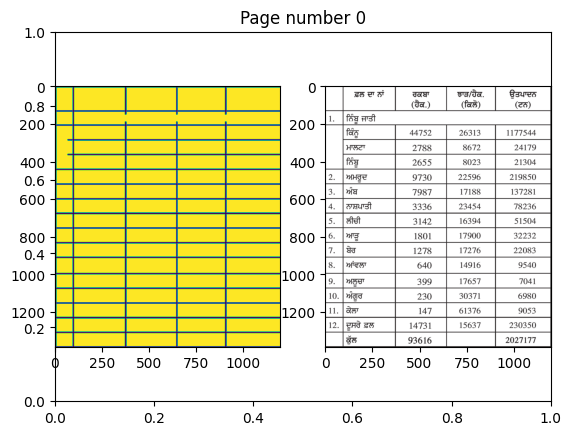

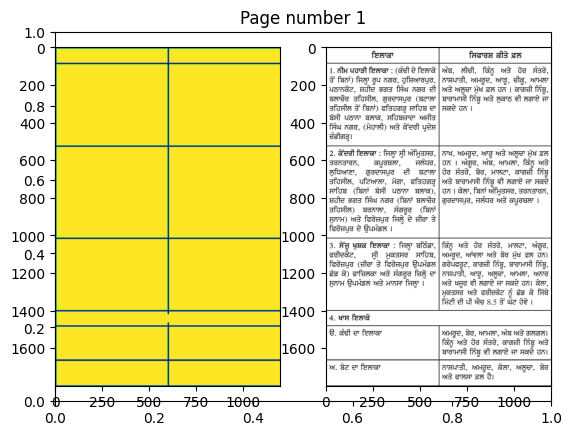

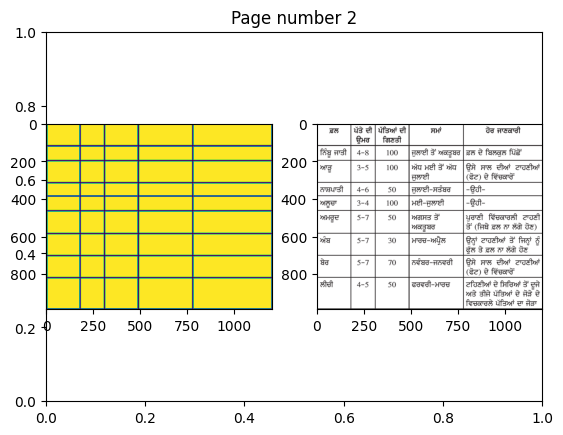

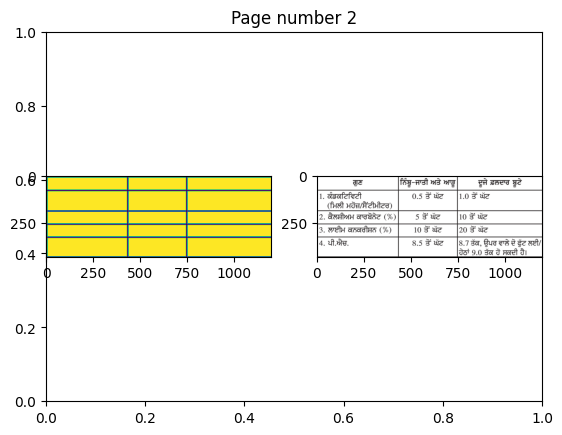

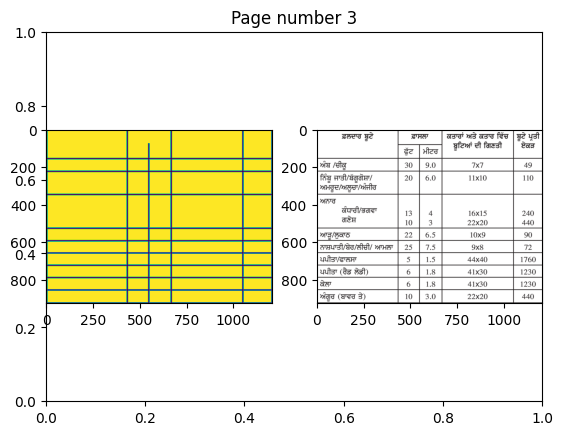

...

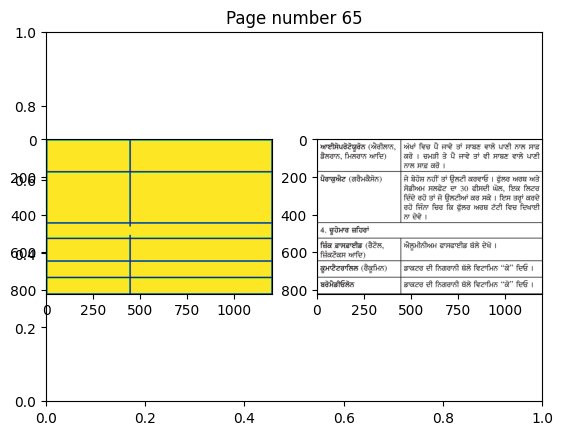

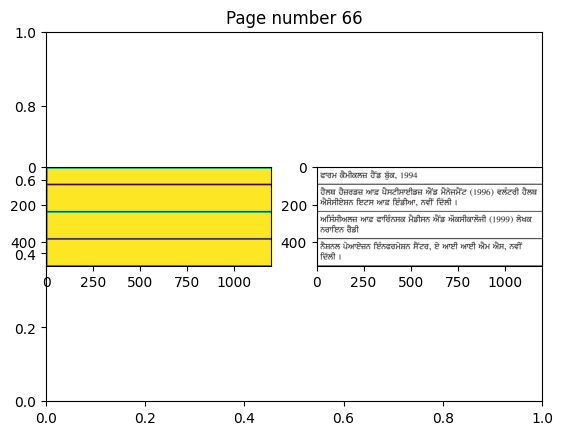

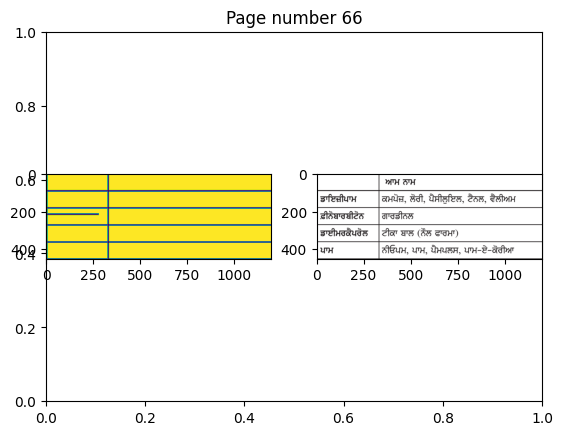

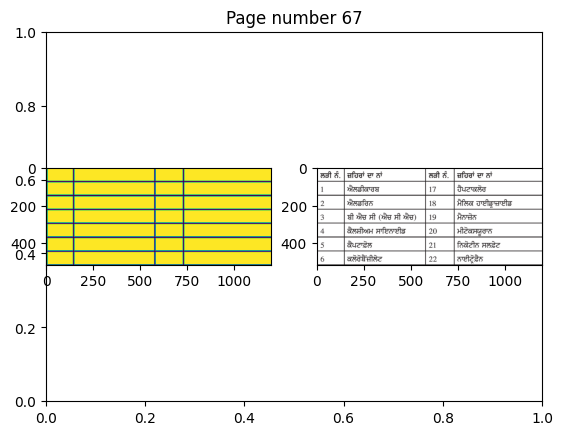

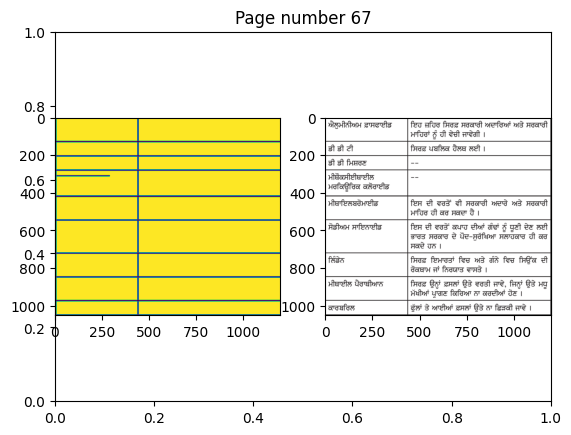

In [16]:
for idx,page in enumerate(tables):
    for table in page:
        plt.title(f'Page number {idx}')
        plt.subplot(121)
        plt.imshow(get_cells_coordinates(table,v_erode=10,v_dilate=15,h_erode=36,h_dilate=45))

        plt.subplot(122)
        plt.imshow(table)

        plt.show()
# 3,5,16,21,32,34,44,47,49,53,58,67

In [18]:
# remove_objects=[(3,1),(47,1),(50,1)]
# for (i,j) in remove_objects:
#     del tables[i][j]

In [19]:
print(len(tables))

68


In [13]:
# tables=[tables[1],tables[10],tables[11]]
error_pages1=[3,5,16,20,21,32,34,44,47,49,53,58,67]
print(len(error_pages1))

13


In [21]:
# page_no=[]
# for i in range(len(tables)):
#     if i not in error_pages1:
#         page_no.append(i)
# print(page_no)

In [22]:
# new_tables=[]
# for i in range(len(tables)):
#     if i not in error_pages1:
#         new_tables.append(tables[i])
# tables=new_tables

In [14]:
print(len(tables))

68


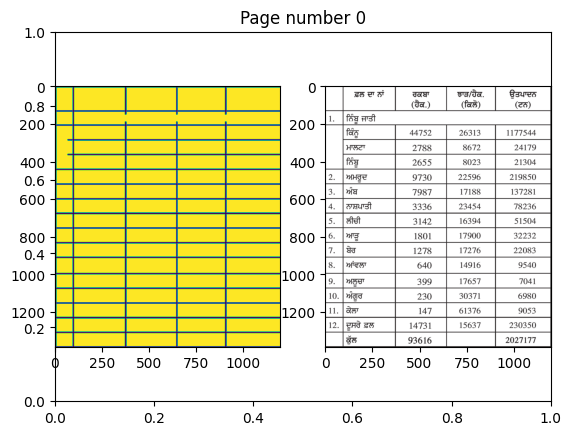

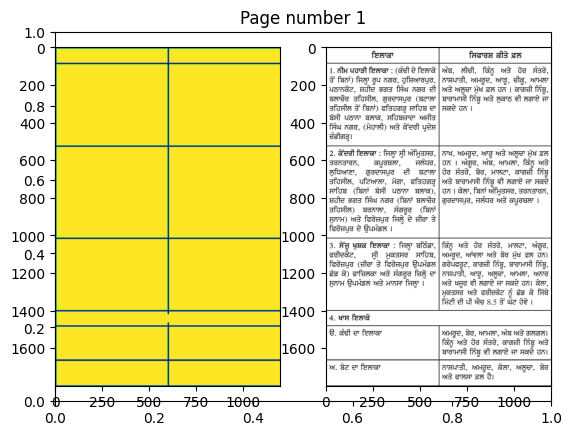

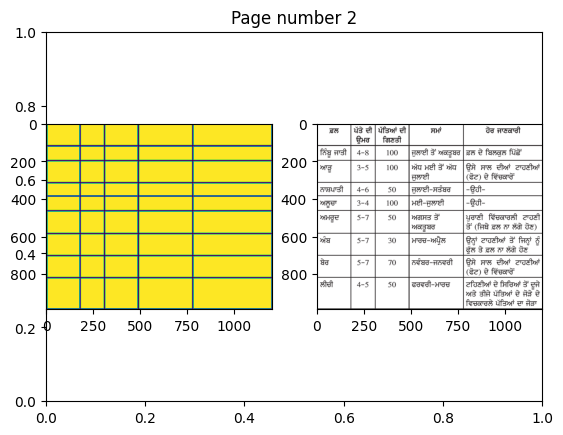

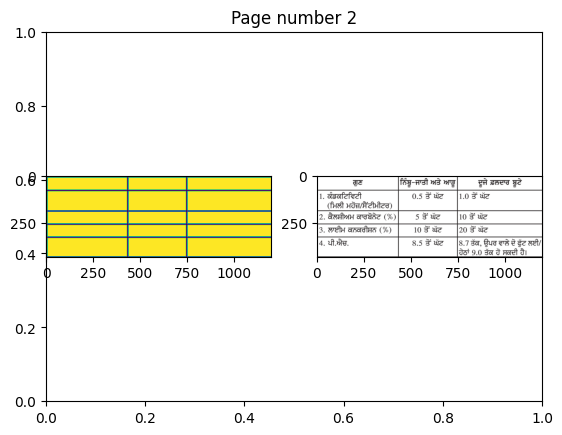

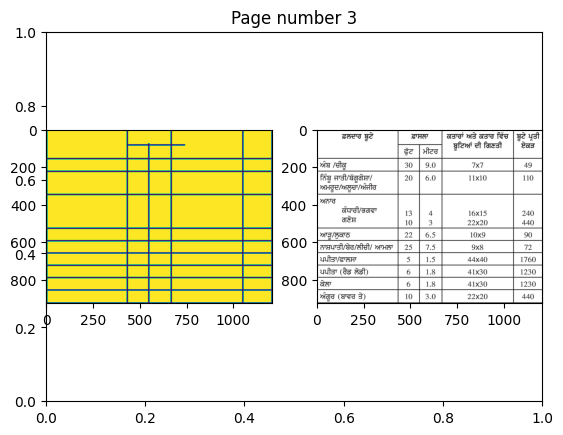

...

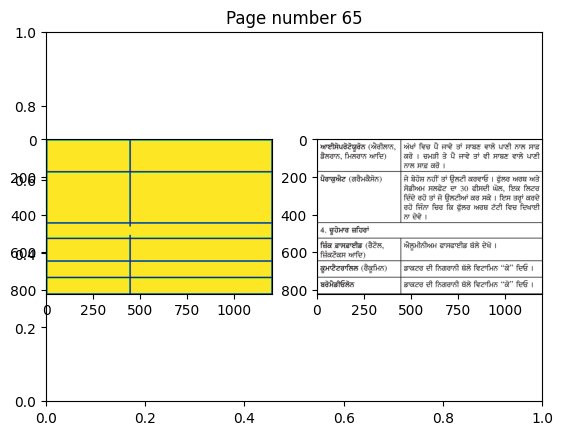

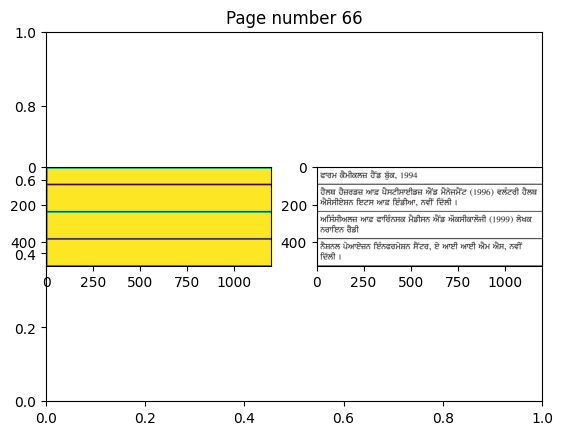

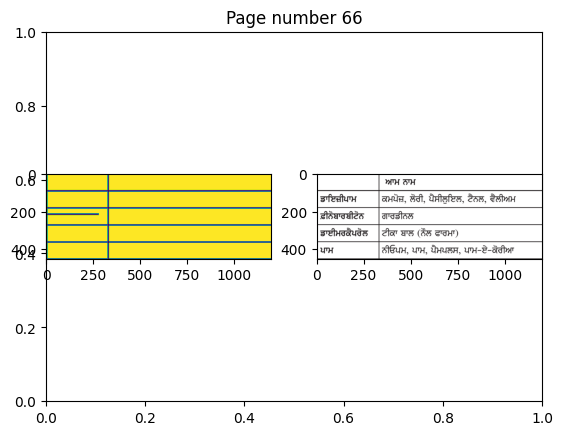

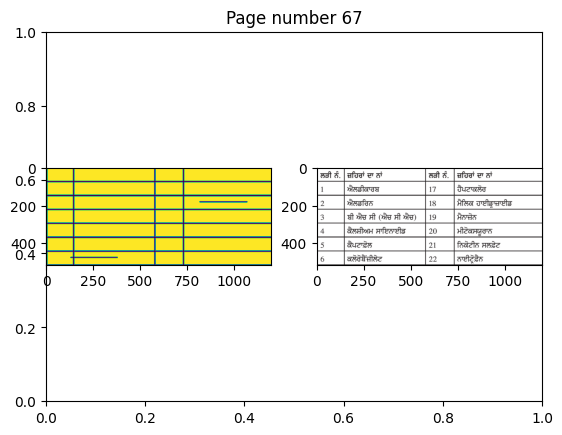

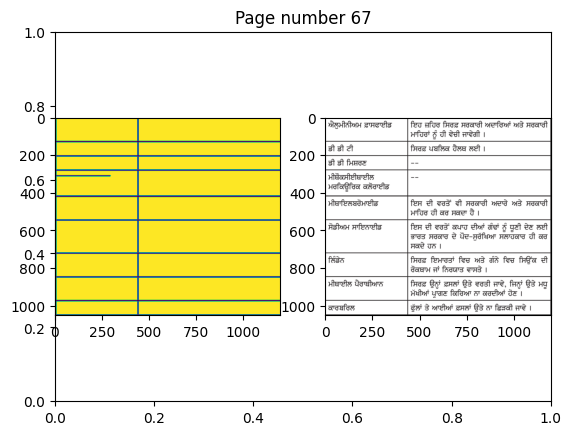

In [15]:
for idx,page in enumerate(tables):
    for table in page:
        if(idx not in error_pages1):
            plt.title(f'Page number {idx}')
            plt.subplot(121)
            plt.imshow(get_cells_coordinates(table,v_erode=10,v_dilate=15,h_erode=36,h_dilate=45))
    
            plt.subplot(122)
            plt.imshow(table)
    
            plt.show()
        else:
            plt.title(f'Page number {idx}')
            plt.subplot(121)
            plt.imshow(get_cells_coordinates(table,v_erode=10,v_dilate=15,h_erode=30,h_dilate=40))
    
            plt.subplot(122)
            plt.imshow(table)
    
            plt.show()

In [16]:
all_text = ''
for idx,table in enumerate(tables):
    if(idx not in error_pages1):
        all_text = all_text + f'page-{idx}\n'
    #     print(len(table))
        for curr in table:
            try:
                bounding_boxes = get_cells_coordinates_include_verification(curr,v_erode=10,v_dilate=15,h_erode=36,h_dilate=45)
                ocr = get_text_csv(bounding_boxes,curr)
                all_text = all_text + ocr + '\n'
                # print(ocr)
            except:
                continue
        all_text = all_text + '\n\n\n\n'
    else:
        all_text = all_text + f'page-{idx}\n'
#     print(len(table))
        for curr in table:
            try:
                bounding_boxes = get_cells_coordinates_include_verification(curr,v_erode=15,v_dilate=20,h_erode=30,h_dilate=40)
                ocr = get_text_csv2(bounding_boxes,curr)
                all_text = all_text + ocr + '\n'
                # print(ocr)
            except:
                continue
        all_text = all_text + '\n\n\n\n'

(286, 122) (1199, 1385)
(591, 77) (1199, 1799)
(414, 109) (1199, 987)
(446, 66) (1199, 429)
(149, 147) (1204, 926)
(635, 539) (645, 549)


 n


(591, 70) (1199, 1224)
(331, 117) (1205, 467)
(145, 78) (1203, 602)
(493, 122) (1199, 1410)
(983, 77) (1199, 1386)
(990, 74) (1199, 1291)
(581, 76) (1199, 1944)
(581, 421) (1199, 2104)
(581, 974) (1199, 1883)
(579, 61) (1199, 522)
(579, 61) (1199, 874)
(581, 495) (1199, 505)
(579, 248) (1199, 2103)
(579, 354) (1199, 2108)
(748, 64) (1199, 474)
(505, 67) (1204, 867)
(1034, 63) (1200, 1026)
(565, 56) (1199, 1006)
(565, 69) (1199, 749)
(565, 428) (1199, 1245)
(565, 435) (1199, 445)
(630, 84) (1201, 592)
(512, 69) (1199, 510)
(1200, 215) (1200, 215)
same
(512, 407) (1199, 1817)
(419, 59) (1199, 596)
(512, 814) (1199, 1404)
(419, 465) (1199, 1823)
(779, 84) (1199, 512)
(512, 69) (1199, 1032)
(512, 263) (1199, 1860)
(615, 63) (1199, 1070)
(392, 75) (1199, 409)
(522, 60) (1200, 772)
(523, 74) (1199, 951)
(779, 66) (1199, 436)
(1200, 345) (1200, 345)
same
(737, 75) (1196, 478)
(1200, 331) (1200, 331)
same
(232, 169) (1199, 473)
(468, 68) (1199, 1609)
(468, 1124) (1199, 1730)
(640, 68) (1199, 1

 n


(636, 70) (1199, 535)
(554, 68) (1199, 409)
(1200, 377) (1200, 377)
same
(731, 85) (1199, 533)
(23, 21) (156, 34)


 n


(635, 817) (645, 827)


 n


(468, 68) (1199, 961)
(468, 69) (1199, 485)
(468, 1) (1200, 355)
(468, 68) (1199, 724)
(1200, 286) (1200, 286)
same
(379, 113) (1199, 964)
(754, 116) (1199, 545)
(468, 68) (1199, 1829)
(226, 83) (1198, 1820)
(1200, 302) (1200, 302)
same
(1200, 292) (1200, 292)
same
(290, 113) (1199, 1926)
(746, 82) (1199, 1719)
(746, 478) (1199, 2071)
(746, 674) (1199, 2022)
(746, 263) (1199, 2110)
(746, 87) (1199, 2062)
(746, 163) (1199, 821)
(1189, 82) (1199, 526)
(862, 82) (1199, 453)
(463, 66) (1199, 516)
(752, 119) (1199, 1052)


In [17]:
print(all_text)

page-0
,ਫ਼ਲ ਦਾ ਨਾਂ,ਰਕਬਾ(ਹੈਕ.),ਝਾੜ/ਹੈਕ.(ਕਿਲੋ),ਉਤਪਾਦਨ(ਟਨ),
1.,ਨਿੰਬੂ ਜਾਤੀ,ਨਿੰਬੂ ਜਾਤੀ,ਨਿੰਬੂ ਜਾਤੀ,ਨਿੰਬੂ ਜਾਤੀ,
,ਕਿੰਨੂ,44752,26313,1177544,
,ਮਾਲਣਾ,2788,8672,24179,
,ਨਿੰਬੂ,2655,8023,21304,
2.,ਅਮਰੂਦ,9730,22596,219850,
3.,ਅੰਬ,7987,17188,137281,
2.,ਨਾਸ਼ਪਾਤੀ,3336,23454,78236,
5.,ਲੀਚੀ,3142,16394,51504,
6.,ਆਤੂੰ,1801,17900,32232,
7.,ਬੇਰ,1278,17276,22083,
5.,ਆਂਵਲਾ,640,14916,9540,
9.,ਅਲੂਚਾ,399,17657,7041,
10.,ਅੰਗੂਰ,230,30371,6980,
11.,ਕੇਲਾ,147,61376,9053,
12.,ਦੂਸਰੇ ਫ਼ਲ,14731,15637,230350,
,,93616,,2027177,





page-1
ਇਲਾਕਾ,ਸਿਫਾਰਸ਼ ਕੀਤੇ ਫ਼ਲ,
1. ਨੀਮ ਪਹਾੜੀ ਇਲਾਕਾ : (ਕੰਢੀ ਦੇ ਇਲਾਕੇਤੋਂ ਬਿਨਾਂ) ਜਿਲ੍ਹਾ ਰੂਪ ਨਗਰ, ਹੁਸ਼ਿਆਰਪੁਰ,ਪਠਾਨਕੋਟ, ਸ਼ਹੀਦ ਭਗਤ ਸਿੰਘ ਨਗਰ ਦੀਬਲਾਚੌਰ ਤਹਿਸੀਲ, ਗੁਰਦਾਸਪੁਰ (ਬਟਾਲਾਤਹਿਸੀਲ ਤੋਂ' ਬਿਨਾਂ) ਫਤਿਹਗੜ੍ਹ ਸਾਹਿਬ ਦਾਬਸੀ ਪਠਾਨਾ ਬਲਾਕ, ਸਹਿਬਜ਼ਾਦਾ ਅਜੀਤਸਿੰਘ ਨਗਰ, (ਮੋਹਾਲੀ) ਅਤੇ ਕੇਂਦਰੀ ਪ੍ਰਦੇਸ਼ਚੰਡੀਗੜ੍ਹ।,ਅੰਬ, ਲੀਚੀ, ਕਿੰਨੂ ਅਤੇ ਹੋਰ ਸੰਤਰੇ,ਨਾਸ਼ਪਾਤੀ, ਅਮਰੂਦ, ਆੜ੍ੂ, ਚੀਕੂ, ਆਮਲਾਅਤੇ ਅਲੂਚਾ ਮੁੱਖ ਫ਼ਲ ਹਨ । ਕਾਗਜ਼ੀ ਨਿੰਬੂ,ਬਾਰਾਮਾਸੀ ਨਿੰਬੂ ਅਤੇ ਲੁਕਾਠ ਵੀ ਲਗਾਏ ਜਾਸਕਦੇ ਹਨ ।,
2. ਕੇਂਦਰੀ ਇਲਾਕਾ : ਜਿਲ੍ਹਾ ਸੀ ਅੰਮ੍ਰਿਤਸਰ,ਤਰਨਤਾਰਨ,  ਕਪੂਰਥਲਾ, ਜਲੰਧਰ,ਲੁਧਿਆਣਾ, ਗੁਰ

In [12]:
error_pages1
# 20

[3, 5, 16, 21, 32, 34, 44, 47, 49, 53, 58, 67]

In [18]:
f=open('data_books/ocr_punjabi/pp_fruits_table.txt','w')
f.write(all_text)
f.close()

In [31]:
# tables = [get_tables(np.array(image)) for image in images]
# remove_objects=[(3,1),(4,0),(48,1),(51,1)]
# # for (i,j) in remove_objects:
#     del tables[i][j]
# tables=[tables[i] for i in error_pages1]

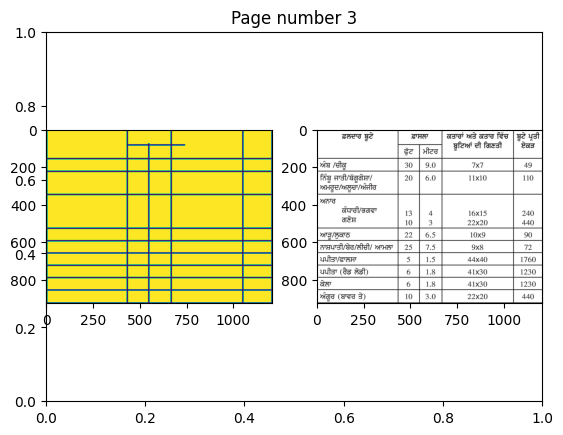

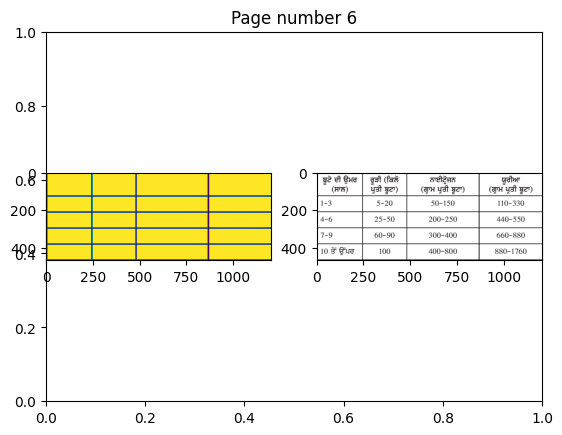

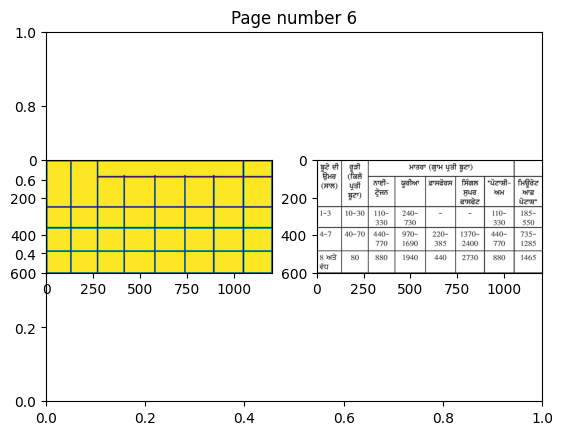

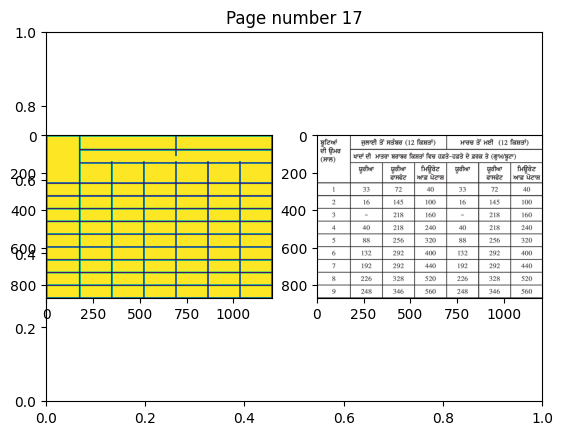

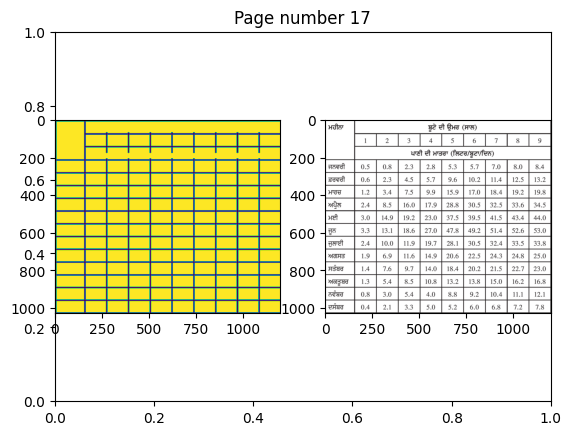

...

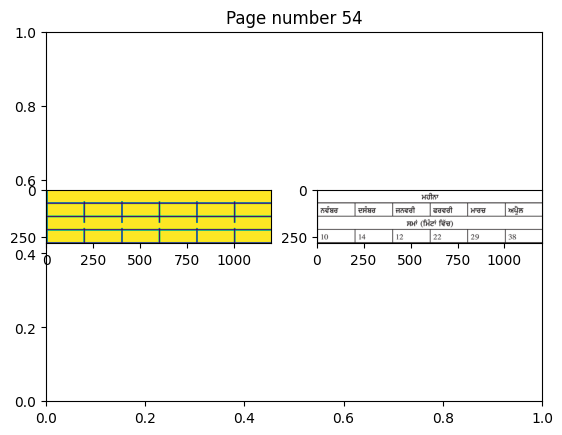

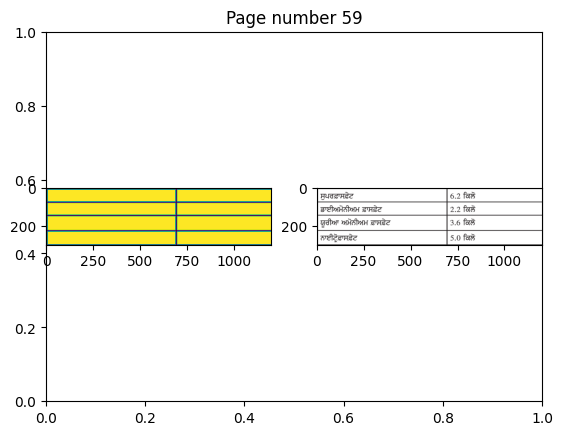

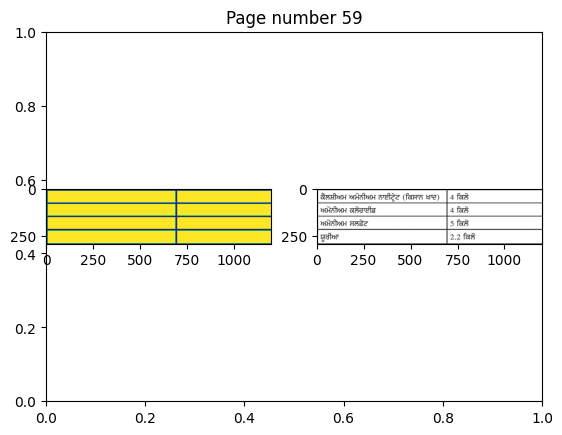

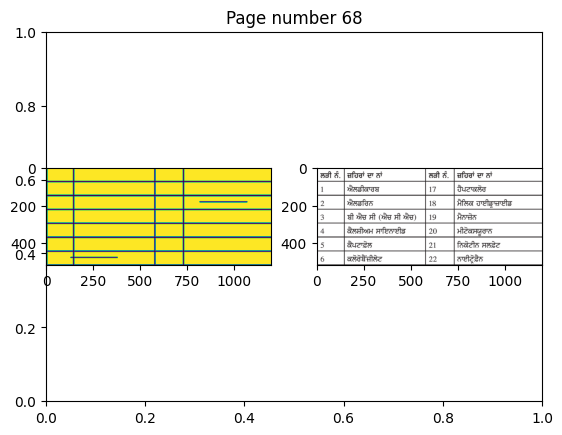

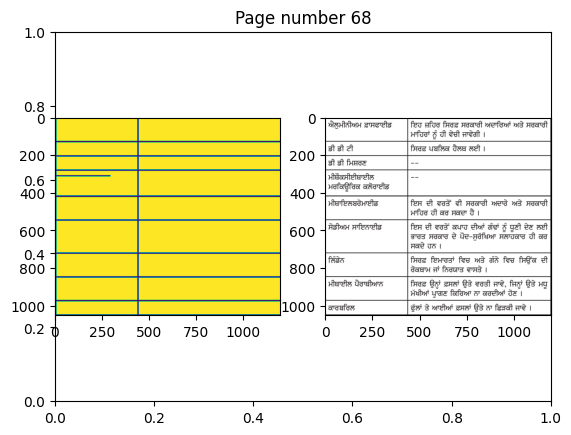

In [34]:
for idx,page in enumerate(tables):
    for table in page:
        plt.title(f'Page number {error_pages1[idx]}')
        plt.subplot(121)
        plt.imshow(get_cells_coordinates(table,v_erode=10,v_dilate=15,h_erode=30,h_dilate=40))

        plt.subplot(122)
        plt.imshow(table)

        plt.show()

In [35]:
all_text = ''
for idx,table in enumerate(tables):
    all_text = all_text + f'page-{error_pages1[idx]}\n'
#     print(len(table))
    for curr in table:
        try:
            bounding_boxes = get_cells_coordinates_include_verification(curr,v_erode=15,v_dilate=20,h_erode=30,h_dilate=40)
            ocr = get_text_csv2(bounding_boxes,curr)
            all_text = all_text + ocr + '\n'
            # print(ocr)
        except:
            continue
    all_text = all_text + '\n\n\n\n'

(149, 147) (1204, 926)
(331, 117) (1205, 467)
(145, 78) (1203, 602)
(505, 67) (1204, 867)
(1034, 63) (1200, 1026)
(630, 84) (1201, 592)
(512, 69) (1199, 510)
(1200, 215) (1200, 215)
same
(1200, 345) (1200, 345)
same
(1200, 331) (1200, 331)
same
(1200, 240) (1200, 240)
same
(838, 71) (1200, 743)
(554, 68) (1199, 409)
(1200, 377) (1200, 377)
same
(1200, 286) (1200, 286)
same
(1200, 302) (1200, 302)
same
(1200, 292) (1200, 292)
same
(463, 66) (1199, 516)
(752, 119) (1199, 1052)


In [36]:
print(all_text)

page-3
ਫ਼ਲਦਾਰ ਬੂਟੇ,ਫ਼ਾਸਲਾ,ਫ਼ਾਸਲਾ,ਕਤਾਰਾਂ ਅਤੇ ਕਤਾਰ ਵਿੱਚਬੂਟਿਆਂ ਦੀ ਗਿਣਤੀ,ਬੂਟੇ ਪੂਤੀਏਕੜ,
ਫ਼ਲਦਾਰ ਬੂਟੇ,ਫੌਂਟ,ਮੀਟਰ,ਕਤਾਰਾਂ ਅਤੇ ਕਤਾਰ ਵਿੱਚਬੂਟਿਆਂ ਦੀ ਗਿਣਤੀ,ਬੂਟੇ ਪੂਤੀਏਕੜ,
ਅੰਬ /ਚੀਕੂ,30,9.0,7%7,49,
ਨਿੰਬੂ ਜਾਤੀ/ਬੋਂਗੂਗੋਸ਼ਾ/ਅਮਰੂਦ/ਅਲੂਚਾ/ਅੰਜੀਰ,20,6.0,11%10,110,
ਅਨਾਰਕੰਧਾਰੀ/ਭਗਵਾਗਣੇਸ਼,1310,43,16%1522%20,240440,
ਆੜੂ/ਲੁਕਾਠ,22,6.5,10%9,90,
ਨਾਸ਼ਪਾਤੀ/ਬੇਰ/ਲੀਚੀ/ ਆਮਲਾ,25,7.5,9%8,72,
ਪਪੀਤਾ/ਫਾਲਸਾ,5,1.5,44840,1760,
ਪਪੀਤਾ (ਰੈਡ ਲੇਡੀ),6,1.5,41830,1230,
ਕੇਲਾ,6,1.8,4130,1230,
ਅੰਗੂਰ (ਬਾਵਰ ਤੇ),10,3.0,22%20,440,





page-6
ਬੂਟੇ ਦੀ ਉਮਰ(ਸਾਲ),ਰੂੜੀ (ਕਿਲੋਪੂਤੀ ਬੂਟਾ),ਨਾਈਟ੍ਰੋਜਨ(ਗ੍ਰਾਮ ਪਤੀ ਬੂਟਾ),ਯੂਰੀਆ(ਗ੍ਰਾਮ ਪੁਤੀ ਬੂਟਾ),
1-3,5-20,50-150,110-330,
4-6,25-50,200-250,440-550,
7-9,60-90,300-400,660-880,
10 ਤੋਂ ਉੱਪਰ,100,400-800,880-1760,

ਬੂਟੇ ਦੀਉਮਰ(ਸਾਲ),ਰੂੜੀ(ਕਿਲੋਪ੍ਰਤੀਬੂਟਾ),ਮਾਤਰਾ (ਗ੍ਰਾਮ ਪ੍ਰਤੀ ਬੂਟਾ),ਮਾਤਰਾ (ਗ੍ਰਾਮ ਪ੍ਰਤੀ ਬੂਟਾ),ਮਾਤਰਾ (ਗ੍ਰਾਮ ਪ੍ਰਤੀ ਬੂਟਾ),ਮਾਤਰਾ (ਗ੍ਰਾਮ ਪ੍ਰਤੀ ਬੂਟਾ),ਮਾਤਰਾ (ਗ੍ਰਾਮ ਪ੍ਰਤੀ ਬੂਟਾ),,
ਬੂਟੇ ਦੀਉਮਰ(ਸਾਲ),ਰੂੜੀ(ਕਿਲੋਪ੍ਰਤੀਬੂਟਾ),ਨਾਈ-ਟ੍ਰੋਜਨ,ਯੂਰੀਆ,ਫ਼ਾਸਫੋਰਸ,ਸਿੰਗਲਸੁਪਰਫਾਸਫੇਟ,"ਪੋਟਾਸ਼ੀ-ਅਮ,ਮਿਉਰੇਟਆਫ਼ਪੁਟਾਸ਼",
1-3,10-30,110-330,240-730,,,110-330,185-550

In [37]:
f=open('data_books/ocr_punjabi/pp_fruits_table.txt','a+')
f.write(all_text)
f.close()

In [65]:
book = '/home/aakash/Downloads/WhatsApp Image 2024-04-29 at 2.07.05 AM.pdf'
images = convert_from_path(book,dpi=300)
tables = [get_tables(np.array(image)) for image in images]

In [66]:
tables=[tables[i] for i in [3]]

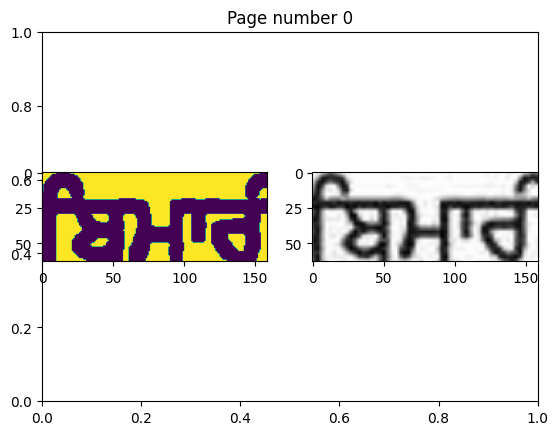

error: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/filterengine.hpp:367: error: (-215:Assertion failed) anchor.inside(Rect(0, 0, ksize.width, ksize.height)) in function 'normalizeAnchor'


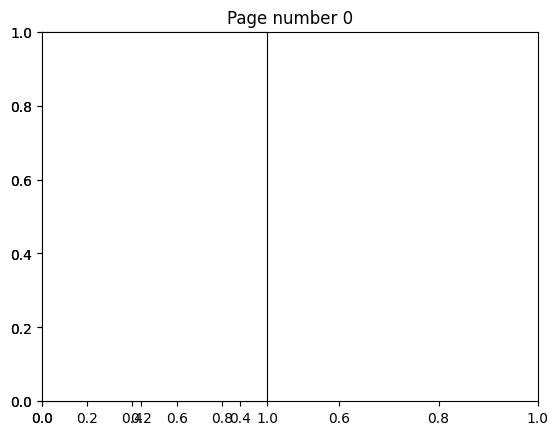

In [67]:
for idx,page in enumerate(tables):
    for table in page:
        plt.title(f'Page number {idx}')
        plt.subplot(121)
        plt.imshow(get_cells_coordinates(table,v_erode=10,v_dilate=15,h_erode=20,h_dilate=35))

        plt.subplot(122)
        plt.imshow(table)

        plt.show()
# 3,5,16,21,32,34,44,47,49,53,58,67

In [59]:
all_text = ''
for idx,table in enumerate(tables):
    all_text = all_text + f'page-{idx}\n'
#     print(len(table))
    for curr in table:
        try:
            bounding_boxes = get_cells_coordinates_include_verification(curr,v_erode=10,v_dilate=15,h_erode=20,h_dilate=35)
            ocr = get_text_csv(bounding_boxes,curr)
            all_text = all_text + ocr + '\n'
            # print(ocr)
        except:
            continue
    all_text = all_text + '\n\n\n\n'

(390, 319) (2343, 1153)


In [60]:
print(all_text)

page-0





